## 3. CRISP-DM: Data Understanding

In [50]:

# imports

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from datetime import datetime
from IPython.display import display
import re
import os
import seaborn as sns
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, roc_auc_score, roc_curve, accuracy_score
from IPython.display import display, Markdown
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import DBSCAN
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from geopy.distance import geodesic

from sklearn.model_selection import train_test_split, cross_val_score, GridSearchCV, KFold
from sklearn.preprocessing import PolynomialFeatures, StandardScaler


from imblearn.over_sampling import SMOTE 
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier, ExtraTreesClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.metrics import roc_auc_score, confusion_matrix, recall_score, precision_score, roc_curve, f1_score
from shapely.geometry import Point 
import geopandas as gpd
import tilemapbase
import math

%matplotlib inline
%config InlineBackend.figure_format = 'retina' # Render high resolution images

# Load datasets
train = pd.read_csv('../data/train.csv')
test = pd.read_csv('../data/test.csv')
weather = pd.read_csv('../data/weather.csv')
spray = pd.read_csv('../data/spray.csv')


### 3. 1 Data Description
Die Daten für die Analyse stammen aus dem Wettbewerb „Predict West Nile Virus“ aus dem Jahr 2015 auf Kaggle. Sie liegen in vier CSV-Dateien vor und umfassen verschiedene Datensätze. Der Hauptdatensatz besteht aus Trainings- und Testdaten. Die Trainingsdatensätze umfassen insgesamt 10.506 Datensätze aus den Jahren 2007, 2009, 2011 und 2013. Der Testdatensatz umfasst die Jahre 2008, 2010, 2012 und 2014 und enthält insgesamt 116.293 Datensätze. Jeder Datensatz enthält das Datum des Tests (Date), eine ungefähre Adresse des Standorts der Falle (Address), die Mückenart (Species), die Blocknummer der Adresse (Block), den Straßennamen (Street) und eine ID der Falle (Trap). Darüber hinaus werden geografische Informationen in Breitengrad (Latitude) und Längengrad (Longitude) umgewandelt. Die Genauigkeit dieser Geokodierung wird im Feld „AddressAccuracy“ angegeben. Zusätzlich wird die Anzahl der in der jeweiligen Falle gefangenen Stechmücken (NumMosquitos) angegeben. Das entscheidende Merkmal dieser Daten ist jedoch „WnvPresent“, das angibt, ob das West-Nil-Virus in den gefangenen Mücken vorhanden war oder nicht (1 = vorhanden, 0 = nicht vorhanden). Dieses Feld ist die Zielvariable im Vorhersagemodell.

Zusätzlich werden noch Wetterdatensätze aus der NOAA (National Weather Service) beigefügt. Diese umfassen 2.945 Wetterdatensätze zwischen Mai 2007 und Oktober 2014, die von zwei Wetterstationen stammen und verschiedene Wetterbedingungen wie z. B. die Tages-Maximaltemperatur (Tmax), den durchschnittlichen Taupunkt (DewPoint) oder die Niederschlagsmenge (PrecipTotal) an den verschiedenen Tagen dokumentieren. Als Maßnahmen zur Mückenbekämpfung werden in den Sprühdatensätzen Daten über Sprühaktionen dokumentiert. Die Sprühdatensätze umfassen das Datum und den Zeitpunkt der gesprühten Orte aus den Jahren 2011 bis 2013. Die Orte sind in GIS-Daten, also Longitude und Latitude, angegeben.


### 3. 2 Attribute Understanding

**Wetterdaten**

| **Attribut**   | **Dimension**          | **Beschreibung**                                                                                                                                                                                                                     |
|----------------|------------------------|--------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------------|
| **Station**    | Kategorisch: 1, 2      | Messstation <br> 1 = CHICAGO O'HARE INTERNATIONAL AIRPORT Lat: 41.995 Lon: -87.933 Elev: 662 ft. above sea level <br> 2 = CHICAGO MIDWAY INTL ARPT Lat: 41.786 Lon: -87.752 Elev: 612 ft. above sea level                           |
| **Date**       | Datum: DD-MM-YYYY      | Tag der Messung                                                                                                                                                                                                                      |
| **Tmax**       | Integer                | Tages-Maximal-Temperatur, in Fahrenheit                                                                                                                                                                                              |
| **Tmin**       | Integer                | Tages-Minimal-Temperatur, in Fahrenheit                                                                                                                                                                                              |
| **Tavg**       | Integer                | Tages-Durchschnittstemperatur, in Fahrenheit                                                                                                                                                                                         |
| **Depart**     | Integer                | Abweichung Temperaturwertes vom langjährigen Durchschnitt oder Normalwert für denselben Zeitraum                                                                                                                                     |
| **DewPoint**   | Integer                | Durchschnittlicher Taupunkt (Temperatur, bei der die Luft vollständig gesättigt ist und Wasser zu kondensieren beginnt)                                                                                                               |
| **WetBulb**    | Integer                | Durchschnittliche Kühlgrenztemperatur (niedrigste Temperatur, die durch Verdunstungskühlung erreicht werden kann)                                                                                                                     |
| **Heat**       | Integer                | Heizgradtage (Differenz zwischen Tages-Durchschnittstemperatur und festgelegter Heizgrenze (65°F), Temperatur ist geringer als Durchschnittstemperatur), in Fahrenheit                                                               |
| **Cool**       | Integer                | Kühlgradtage (Differenz zwischen Tages-Durchschnittstemperatur und festgelegter Heizgrenze (65°F), Temperatur ist höher als Durchschnittstemperatur), in Fahrenheit                                                                  |
| **Sunrise**    | Integer                | berechneter Sonnenaufgang                                                                                                                                                                                                            |
| **Sunset**     | Integer                | berechneter Sonnenuntergang                                                                                                                                                                                                          |
| **CodeSum**    | Kategorisch            | Wetterart: <br> FC TORNADO/WATERSPOUT <br> FC  FUNNEL CLOUD <br> TS  THUNDERSTORM <br> GR  HAIL <br> RA  RAIN <br> DZ  DRIZZLE <br> SN  SNOW <br> SG  SNOW GRAINS <br> GS  SMALL HAIL &/OR SNOW PELLETS <br> PL  ICE PELLETS <br> IC  ICE CRYSTALS <br> FG+ HEAVY FOG (FG & LE.25 MILES VISIBILITY) <br> FG  FOG <br> BR  MIST <br> UP  UNKNOWN PRECIPITATION <br> HZ  HAZE <br> FU  SMOKE <br> VA  VOLCANIC ASH <br> DU  WIDESPREAD DUST <br> DS  DUSTSTORM <br> PO  SAND/DUST WHIRLS <br> SA  SAND <br> SS  SANDSTORM <br> PY  SPRAY <br> SQ  SQUALL  <br> DR  LOW DRIFTING <br> SH  SHOWER <br> FZ  FREEZING <br> MI  SHALLOW <br> PR  PARTIAL <br> BC  PATCHES <br> BL  BLOWING <br> VC  VICINITY <br> -   LIGHT <br> +   HEAVY <br> "NO SIGN" MODERATE    |
| **Depth**      | Integer                | Schneetiefe (in Zoll)                                                                                                                                                                                                                |
| **Water1**     | Integer?               | Wasseräquivalent des Schnees am Boden                                                                                                                                                                                                |
| **SnowFall**   | Float                  | Schneemange (Tiefe), T = Trace, M = missing data                                                                                                                                                                                     |
| **PrecipTotal**| Float                  | Menge an Niederschlag                                                                                                                                                                                                                |
| **StnPressure**| Float                  | Stattionsdruck; Luftdruck, der direkt an der Wetterstation gemessen wird, in Zoll Hg                                                                                                                                                  |
| **SeaLevel**   | Float                  | Luftdruck auf Meereshöhe                                                                                                                                                                                                             |
| **ResultSpeed**| Float                  | Windgeschwindigkeit in mph                                                                                                                                                                                                           |
| **ResultDir**  | Integer                | Windrichtung in Kompassgeraden                                                                                                                                                                                                       |
| **AvgSpeed**   | Float                  | Durchschnittliche Windgeschwindigkeit                                                                                                                                                                                                |


**Spray-Daten**


| **Attribut**  | **Dimension**    | **Beschreibung**                   |
|---------------|------------------|------------------------------------|
| **Date**      | Datum, DD-MM-YYYY| Datum, wann gesprüht wurde         |
| **Time**      | Zeit, hh:mm:ss   | Zeit, wann gesprüht wurde          |
| **Latitude**  | Breitengrad      | Breitengrad, wo gesprüht wurde     |
| **Longitude** | Längengrad       | Längengrad, wo gesprüht wurde      |


**Trainingsdaten**

| **Attribut**                | **Dimension**          | **Beschreibung**                                                                                               |
|-----------------------------|------------------------|---------------------------------------------------------------------------------------------------------------|
| **Date**                    | Datum, DD-MM-YYYY      | Datum, an dem der WNV-Test durchgeführt wird                                                                  |
| **Address**                 | String                 | Ungefähre Adresse des Standorts der Falle                                                                     |
| **Species**                 | String                 | Stechmückenart                                                                                                 |
| **Block**                   | Integer                | Blocknummer der Adresse                                                                                       |
| **Street**                  | String                 | Straßenname                                                                                                   |
| **Trap**                    | Kategorisch?           | ID der Falle                                                                                                  |
| **AddressNumberAndStreet**  | String                 | Ungefähre Adresse, die von GeoCoder zurückgegeben wurde                                                       |
| **Latitude**                | Float                  | Breitengrad, vom GeoCoder zurückgegeben                                                                       |
| **Longitude**               | Float                  | Längengrad, vom GeoCoder zurückgegeben                                                                        |
| **AddressAccuracy**         | Integer                | Von GeoCoder zurückgegebene Genauigkeit                                                                       |
| **NumMosquitos**            | Integer                | Anzahl der in dieser Falle gefangenen Stechmücken                                                             |
| **WnvPresent**              | Boolean                | Ob das West-Nil-Virus in diesen Mücken vorhanden war. 1 = ist vorhanden, 0 = ist nicht vorhanden               |


### 3. 3 Data Quality





**weather.csv**

Die Daten von folgenden Attributen sind entweder unvollständig oder fragwürdig.


| Attribute    | Fehlende Werte       | Bemerkung                                |
|--------------|----------------------|------------------------------------------|
| Tavg         | 11                   |                                          |
| Depart       | 1.472                | Daten nur aus Station 2                            |
| WetBulb      | 4                    |                                          |
| Heat         | 11                   |                                          |
| Cool         | 11                   |                                          |
| Sunrise      | 1.472                | Daten nur aus Station 2                            |
| Sunset       | 1.472                | Daten nur aus Station 2                            |
| CodeSum      | 1.609                |                                          |
| Depth        | 1.472                | Daten nur aus Station 2                            |
| Water        | 2.944 (alle)         |                                          |
| Snowfall     | 1.472                | Daten nur aus Station 2                            |
| StnPressure  | 4                    |                                          |
| SeaLevel     | 9                    |                                          |
| AvgSpeed     | 3                    |                                          |
| StnPressure  | vollständig          |158 Aufzeichnungen, die 0 oder T anzeigen, aber in den Wetterarten(CodeSum) eindeutig als Regenfälle (mit RA, DZ, SH) aufgeführt sind|       

**spray.csv**

Nur die Daten "Time" sind nicht vollständig und es fehlt 584 Daten


**train.csv**

Die Daten sind vollständig

### 3. 4 Data Visualization

In diesem Kapitel wurden verschiedene Diagrammtypen verwendet, um eine tiefgehende Visualisierung und Analyse der Daten durchzuführen. Dabei wurden nicht nur die Zusammenhänge zwischen Wetterfaktoren, Mückenarten und -mengen sowie dem West-Nil-Virus (WNV) aufgezeigt, sondern auch die geografische Verbreitung des Virus mithilfe von Dichtekarten effektiv dargestellt. Abschließend wurde die Korrelationsmatrix aller Attribute und des Virusauftretens vor der Datenextraktion präsentiert. Diese Visualisierungsergebnisse bieten eine anschauliche Unterstützung für das bessere Verständnis der Daten und bilden eine solide Grundlage für die anschließende Datenvorbereitung und Modellaufbau.

#### 3. 4. 1 Mückenanzahl & Virus & Mückenarten

##### Monatliche Mückenzahl über Jahre hinweg

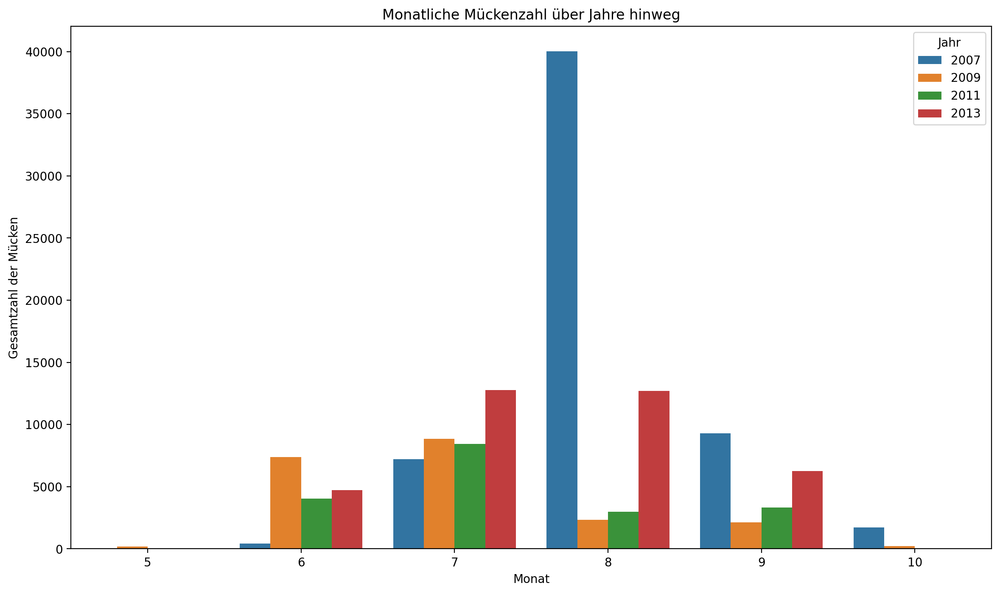

In [17]:
# Datei einlesen und Delimiter setzen
file_path = '../data/train.csv'  
df = pd.read_csv(file_path)

# Konvertieren der 'Date'-Spalte in Datetime-Format
df['Date'] = pd.to_datetime(df['Date'], format='%Y-%m-%d')

# Extrahieren von Jahr und Monat
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month

# Gruppieren nach Jahr und Monat und Summieren der Anzahl der Mücken
monthly_counts = df.groupby(['Year', 'Month']).agg({'NumMosquitos': 'sum'}).reset_index()

# Bar-Chart erstellen
plt.figure(figsize=(14, 8))
sns.barplot(x='Month', y='NumMosquitos', hue='Year', data=monthly_counts, palette='tab10')
plt.title('Monatliche Mückenzahl über Jahre hinweg')
plt.xlabel('Monat')
plt.ylabel('Gesamtzahl der Mücken')
plt.legend(title='Jahr')
plt.show()

##### Monatliche WNV-Vorkommen im Laufe der Jahre

C:\Users\Huawei\AppData\Local\Temp\ipykernel_32380\4045822541.py:17: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x='Month', y='WnvPresent', hue='Year', data=train, ci=None, palette='Spectral')


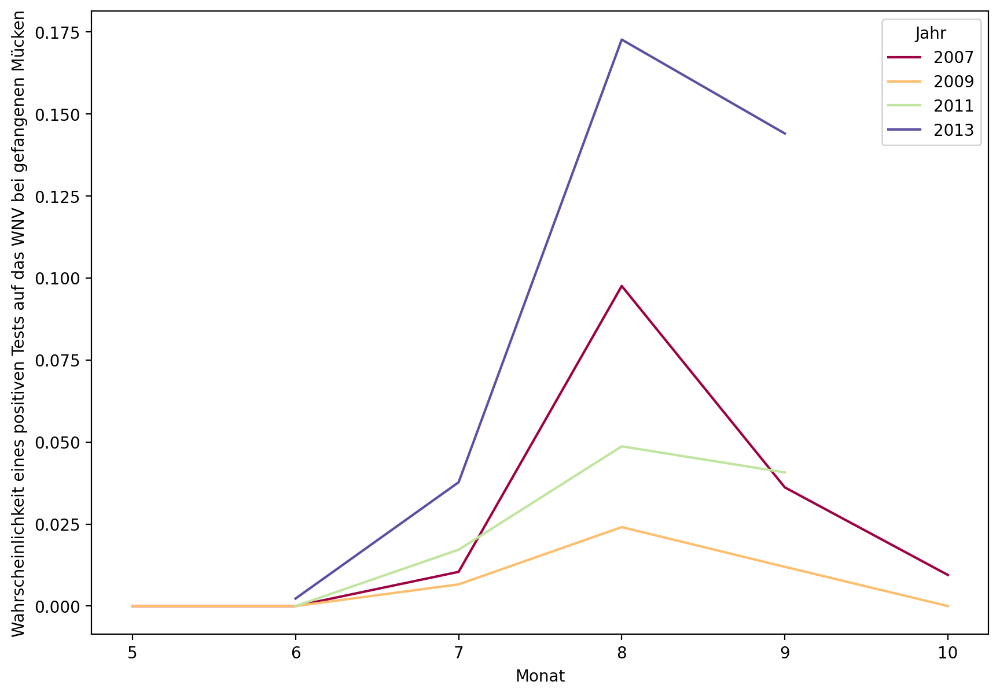

In [18]:
train = pd.read_csv("../data/train.csv")

# Mehrere Spalten mit Adressinformationen entfernen, da sie doppelte Informationen im DataFrame enthalten
train.drop(["Address", "Block", "Street", "AddressAccuracy"], axis=1, inplace=True)

# Datum in datetime konvertieren
train['Date'] = pd.to_datetime(train['Date'])

# Erstellen Sie die Spalten Monat, Woche und Jahr, um bei der vorläufigen EDA zu helfen
train['Month'] = train['Date'].dt.month
train['Week'] = train['Date'].dt.isocalendar().week
train['Year'] = train['Date'].dt.year
train['Year Month'] = train['Date'].dt.strftime('%Y %m')

# Darstellung der WNV-Vorkommen nach Monat und Jahr
plt.subplots(figsize=(10,7))
sns.lineplot(x='Month', y='WnvPresent', hue='Year', data=train, ci=None, palette='Spectral')
plt.xlabel('Monat')
plt.ylabel("Wahrscheinlichkeit eines positiven Tests auf das WNV bei gefangenen Mücken")
plt.legend(title="Jahr")
plt.show()

##### Anzahl der Mücken mit und ohne Virus

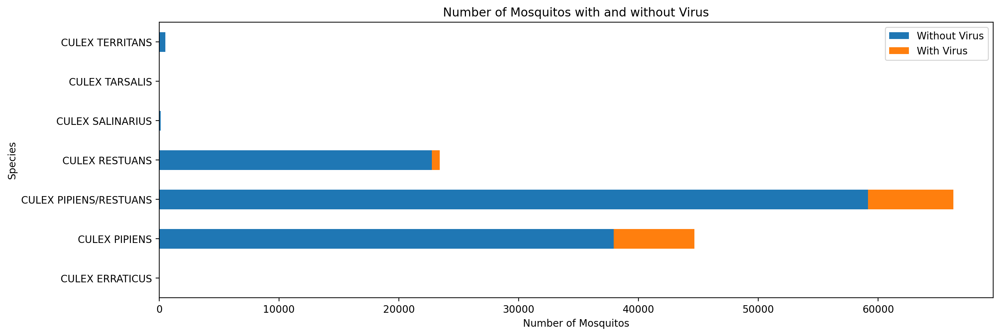

In [19]:
species_with_virus = train.pivot_table(values=['NumMosquitos'], index='Species',
                                       columns='WnvPresent', aggfunc='sum')

species_with_virus.plot(kind='barh', stacked=True, figsize=(15,5))
plt.title("Number of Mosquitos with and without Virus")
plt.xlabel("Number of Mosquitos")
plt.legend(labels=["Without Virus", "With Virus"]);

#### 3. 4. 2 Map-Visualisierungen

In [53]:
###Daten zusammenführen (combined_df erstellen)


# Einlesen und Zuweisen der DataFrames
weather_df = pd.read_csv('../data/weather.csv')
train_df = pd.read_csv('../data/train.csv')

# Outer Join von train_df und weather_df
combined_df = pd.merge(left=train_df, right=weather_df, on="Date", how="outer")

# Überprüfung der Anzahl fehlender Werte in combined_df
combined_df.isnull().sum()

### Vorbereitung von train_df

# Funktion zur Konvertierung von Spaltennamen in Kleinbuchstaben definieren
def clean_columns(col):
    return col.lower()

# Anwenden von Kleinbuchstaben auf alle Spalten in train_df
train_df.columns = [clean_columns(col) for col in train_df]

# Überprüfung auf doppelte Zeilen in train_df
print(f'Es gibt {len(train_df[train_df.duplicated()])} doppelte Zeilen in train_df.')

# Entfernen von Duplikaten
train_df.drop_duplicates(inplace=True)


### Vorbereitung von weather_df

# Anwenden von Kleinbuchstaben auf alle Spalten in weather_df
weather_df.columns = [clean_columns(col) for col in weather_df]

# Redefinition von weather_df für nur Station 1, da Station 2 zu viele fehlende Werte hat (beide Stationen messen dieselben Merkmale)
weather_df = weather_df[weather_df["station"] == 1]
weather_df.head()

# Entfernen von nicht benötigten Spalten
weather_df.drop(['depart', 'heat', 'cool', 'sunrise', 'sunset'], axis=1, inplace=True)

# Entfernen von Zeilen mit 'M' Werten (fehlende Daten) in der 'wetbulb' Spalte
weather_df = weather_df[weather_df.wetbulb != 'M']

# Funktion zur Entfernung von Leerzeichen aus Text definieren
def clean_text(text):
    text = re.sub(' ', '', text)
    return text

# Entfernen von Leerzeichen in Werten der 'codesum' Spalte, um Zellen zu überprüfen, die leer sind ("NO SIGN" = gemäß NOAA-Dokumentation moderat)
weather_df["codesum"].map(clean_text)

# Ersetzen leerer Zeichenfolgenwerte durch "moderate" gemäß NOAA-Dokumentation
weather_df["codesum"] = weather_df["codesum"].replace(" ", "moderate")

# Wir können die 'depth' Spalte entfernen, da alle Zeilen den Wert '0' haben
weather_df.drop(['depth'], axis=1, inplace=True)

# Da die gesamte Spalte aus 'M' (fehlende Werte) besteht, werden wir die 'water1' Spalte ebenfalls entfernen
weather_df.drop(['water1'], axis=1, inplace=True)

# Da Daten zwischen Mai und Oktober (nicht während der Wintersaison) gesammelt wurden,
# mehr als die Hälfte der Daten fehlt und knapp die Hälfte sind 0, entfernen wir die gesamte Spalte
weather_df.drop(['snowfall'], axis=1, inplace=True)

# Laut NOAA-Dokumentation steht T für Spurmenge an Niederschlag
# Ersetzen von T durch 0.005 (MUSS ZURÜCKGEHEN UND DAS ÜBERPRÜFEN)
weather_df["preciptotal"] = weather_df["preciptotal"].replace("  T", "0.005")

# Redefinition von weather_df ohne Zeilen mit fehlenden Werten ('M') in der 'preciptotal' Spalte
weather_df = weather_df[weather_df.preciptotal != 'M']
weather_df = weather_df[weather_df.stnpressure != 'M']
weather_df = weather_df[weather_df.sealevel != 'M']

# Konvertieren von Objektdatentypen in Int und Float
weather_df['tavg'] = weather_df['tavg'].astype(int)
weather_df['wetbulb'] = weather_df['wetbulb'].astype(int)
weather_df["preciptotal"] = weather_df["preciptotal"].astype(float)
weather_df['stnpressure'] = weather_df['stnpressure'].astype(float)
weather_df['sealevel'] = weather_df['sealevel'].astype(float)
weather_df['avgspeed'] = weather_df['avgspeed'].astype(float)

### Erstellen von combined_df

# Outer Join von train_df und weather_df
combined_df = pd.merge(left=train_df, right=weather_df, on="date", how="outer")

# Entfernen von Zeilen mit fehlenden Werten
combined_df = combined_df.dropna()

# Da combined_df nur Ergebnisse von Station 1 enthält, können wir die 'station' Spalte entfernen
# Außerdem, um unsere Analyse zu vereinfachen, entfernen wir wiederholte Spalten für die Adresse.
combined_df.drop(['station', 'address', 'addressnumberandstreet'], axis=1, inplace=True)

# Bereinigung der 'date' Spalte durch Konvertierung in Timestamp
combined_df['date'] = pd.to_datetime(combined_df['date'])

# Erstellen von 3 neuen Spalten, um Jahr, Monat und Tag zu trennen
combined_df['year'] = combined_df['date'].apply(lambda time: time.year)
combined_df['month'] = combined_df['date'].apply(lambda time: time.month)
combined_df['day'] = combined_df['date'].apply(lambda time: time.day)

# Anzeige von Informationen des kombinierten DataFrames
combined_df.info()

# Speichern von combined_df in eine CSV-Datei
combined_df.to_csv('../data/combined_df.csv', index=False)


Es gibt 813 doppelte Zeilen in train_df.
<class 'pandas.core.frame.DataFrame'>
Index: 9601 entries, 28 to 10843
Data columns (total 25 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   date             9601 non-null   datetime64[ns]
 1   species          9601 non-null   object        
 2   block            9601 non-null   float64       
 3   street           9601 non-null   object        
 4   trap             9601 non-null   object        
 5   latitude         9601 non-null   float64       
 6   longitude        9601 non-null   float64       
 7   addressaccuracy  9601 non-null   float64       
 8   nummosquitos     9601 non-null   float64       
 9   wnvpresent       9601 non-null   float64       
 10  tmax             9601 non-null   float64       
 11  tmin             9601 non-null   float64       
 12  tavg             9601 non-null   float64       
 13  dewpoint         9601 non-null   float64       
 14  we

##### Geografische Verteilung von gefangenen Mücken in Chicago

C:\Users\Huawei\AppData\Local\Temp\ipykernel_32380\1966519797.py:23: UserWarning: 

`shade_lowest` has been replaced by `thresh`; setting `thresh=0.05.
This will become an error in seaborn v0.14.0; please update your code.

  density_plot = sns.kdeplot(
C:\Users\Huawei\AppData\Local\Temp\ipykernel_32380\1966519797.py:23: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  density_plot = sns.kdeplot(


Text(0, 0.5, 'Breitengrad')

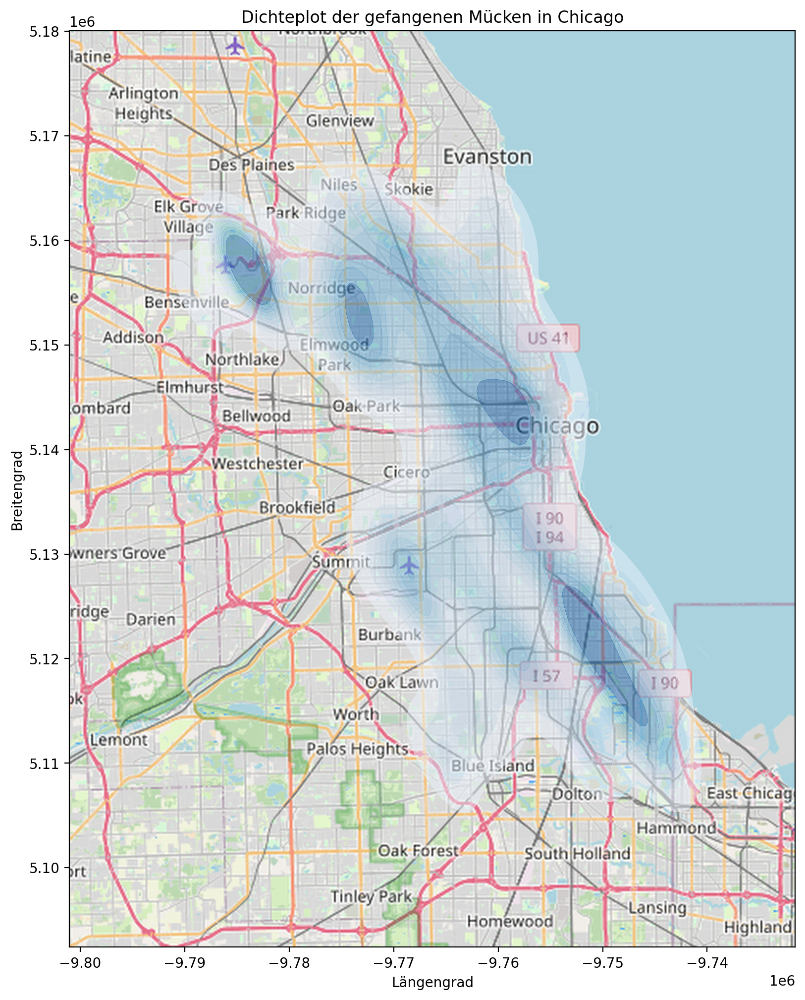

In [36]:
# Geometrie aus Längengrad und Breitengrad erzeugen, um sie für die Kartierung vorzubereiten
geometry = [Point(xy) for xy in zip(combined_df['longitude'], combined_df['latitude'])]
geometry[:3]
geo_df = gpd.GeoDataFrame(combined_df, geometry=geometry)

# Setzen des Koordinatensystems auf EPSG:4326 und Umwandlung in EPSG:3857
geo_df = geo_df.set_crs('epsg:4326')
geo_df = geo_df.to_crs("EPSG:3857")

# Straßenkarte von Chicago generieren
street_map = gpd.read_file('../media/city boundaries google/')
street_map = street_map.to_crs("EPSG:3857")

tilemapbase.start_logging()
tilemapbase.init(create=True)
extent = tilemapbase.extent_from_frame(street_map, buffer=25)

# Dichteplot der gesamten Mückenanzahl aus den Fallen
t = tilemapbase.tiles.build_OSM()
fig, ax = plt.subplots(figsize=(12,12))
plotter = tilemapbase.Plotter(extent, t, width=250)
plotter.plot(ax)
density_plot = sns.kdeplot(
                x=geo_df['geometry'].x,
                y=geo_df['geometry'].y,
                shade=True,
                alpha=0.5,
                cmap="Blues",
                shade_lowest=False,
                zorder=3
                )
plt.title("Dichteplot der gefangenen Mücken in Chicago")  
plt.xlabel("Längengrad")  
plt.ylabel("Breitengrad")  

##### Geografische Verteilung von WNV-Mücken in Chicago

C:\Users\Huawei\AppData\Local\Temp\ipykernel_32380\1497810917.py:14: UserWarning: 

`shade_lowest` has been replaced by `thresh`; setting `thresh=0.05.
This will become an error in seaborn v0.14.0; please update your code.

  density_plot = sns.kdeplot(
C:\Users\Huawei\AppData\Local\Temp\ipykernel_32380\1497810917.py:14: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  density_plot = sns.kdeplot(


Text(0, 0.5, 'Breitengrad')

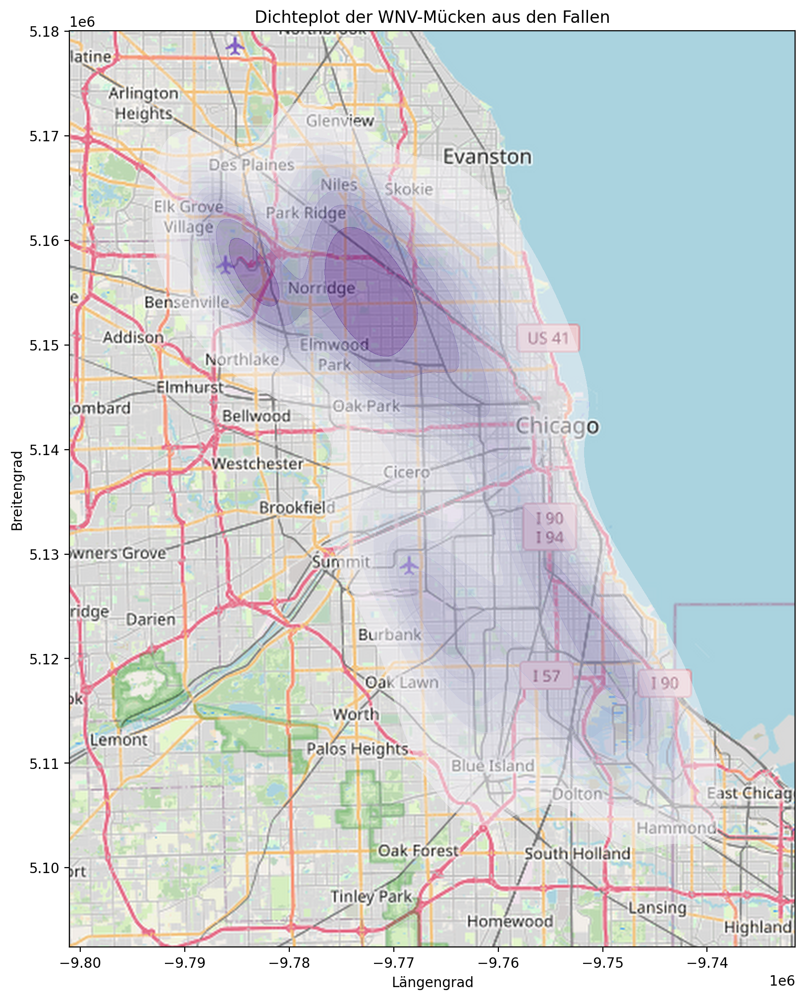

In [37]:
# Tilemapbase initialisieren,
# damit wir die Grundkarte darstellen können, um unsere Mücken- und Sprühstellen zu visualisieren
tilemapbase.start_logging()
tilemapbase.init(create=True)
extent = tilemapbase.extent_from_frame(street_map, buffer=25)
wnv_present = geo_df[geo_df['wnvpresent'] == 1]
wnv_absent = geo_df[geo_df['wnvpresent'] == 0]

# Dichteplot der WNV-Mückenanzahl aus den Fallen
t = tilemapbase.tiles.build_OSM()
fig, ax = plt.subplots(figsize=(12,12))
plotter = tilemapbase.Plotter(extent, t, width=250)
plotter.plot(ax)
density_plot = sns.kdeplot(
                x=wnv_present['geometry'].x,
                y=wnv_present['geometry'].y,
                shade=True,
                alpha=0.5,
                cmap="Purples",
                shade_lowest=False,
                zorder=3
                )
plt.title("Dichteplot der WNV-Mücken aus den Fallen")
plt.xlabel("Längengrad")
plt.ylabel("Breitengrad")

##### Geografische Verteilung des Pestizidsprühgebiets

C:\Users\Huawei\AppData\Local\Temp\ipykernel_32380\663188945.py:20: UserWarning: 

`shade_lowest` has been replaced by `thresh`; setting `thresh=0.05.
This will become an error in seaborn v0.14.0; please update your code.

  density_plot = sns.kdeplot(
C:\Users\Huawei\AppData\Local\Temp\ipykernel_32380\663188945.py:20: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  density_plot = sns.kdeplot(


Text(0, 0.5, 'Breitengrad')

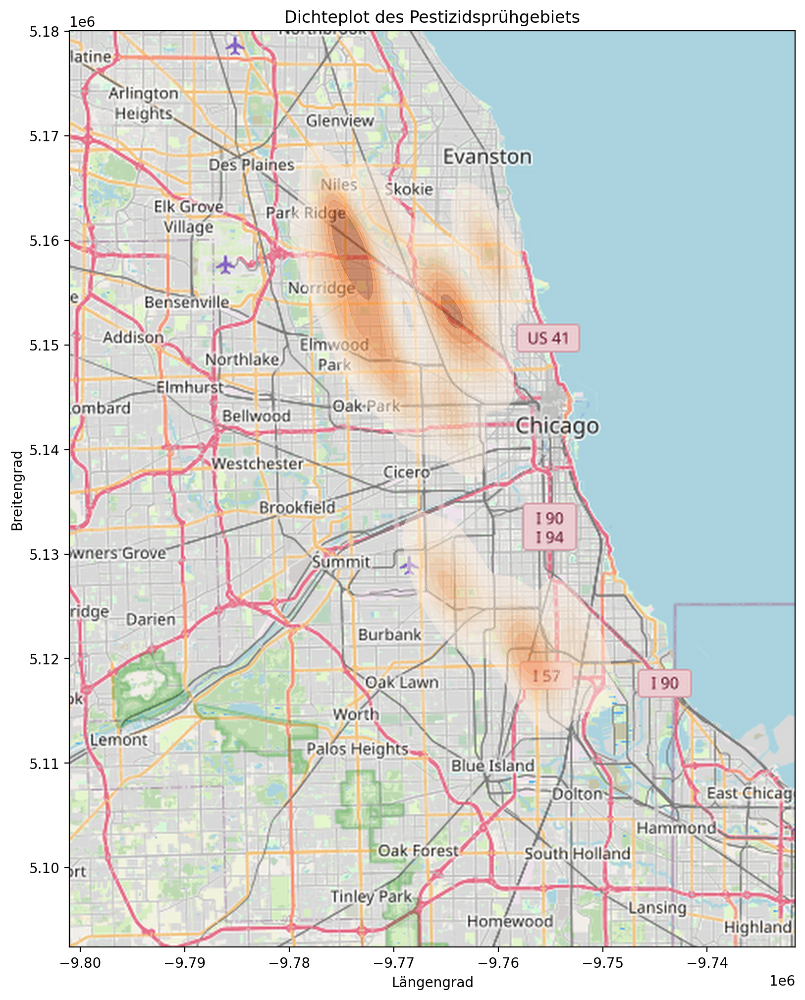

In [38]:
spray_df = pd.read_csv('../data/spray.csv')

# Geometrie für SPRAY-Daten erzeugen
spray_geometry = [Point(xy) for xy in zip(spray_df['Longitude'], spray_df['Latitude'])]
spraygeo_df = gpd.GeoDataFrame(spray_df, geometry=spray_geometry)

# Koordinatensystem setzen und umwandeln
spraygeo_df = spraygeo_df.set_crs('epsg:4326')
spraygeo_df = spraygeo_df.to_crs("EPSG:3857")

tilemapbase.start_logging()
tilemapbase.init(create=True)
extent = tilemapbase.extent_from_frame(street_map, buffer=25)

# Dichteplot für das SPRAY-Gebiet
t = tilemapbase.tiles.build_OSM()
fig, ax = plt.subplots(figsize=(12,12))
plotter = tilemapbase.Plotter(extent, t, width=250)
plotter.plot(ax)
density_plot = sns.kdeplot(
                x=spraygeo_df['geometry'].x,
                y=spraygeo_df['geometry'].y,
                shade=True,
                alpha=0.5,
                cmap="Oranges",  
                shade_lowest=False,
                zorder=3
                )
plt.title("Dichteplot des Pestizidsprühgebiets")
plt.xlabel("Längengrad")
plt.ylabel("Breitengrad")

##### Überlagerung der Dichteplots von WNV-Präsenz und Pestizidsprühgebieten

C:\Users\Huawei\AppData\Local\Temp\ipykernel_32380\3762298891.py:9: UserWarning: 

`shade_lowest` has been replaced by `thresh`; setting `thresh=0.05.
This will become an error in seaborn v0.14.0; please update your code.

  density_plot = sns.kdeplot(
C:\Users\Huawei\AppData\Local\Temp\ipykernel_32380\3762298891.py:9: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  density_plot = sns.kdeplot(
C:\Users\Huawei\AppData\Local\Temp\ipykernel_32380\3762298891.py:20: UserWarning: 

`shade_lowest` has been replaced by `thresh`; setting `thresh=0.05.
This will become an error in seaborn v0.14.0; please update your code.

  density_plot = sns.kdeplot(
C:\Users\Huawei\AppData\Local\Temp\ipykernel_32380\3762298891.py:20: FutureWarning: 

`shade` is now deprecated in favor of `fill`; setting `fill=True`.
This will become an error in seaborn v0.14.0; please update your code.

  density_plot

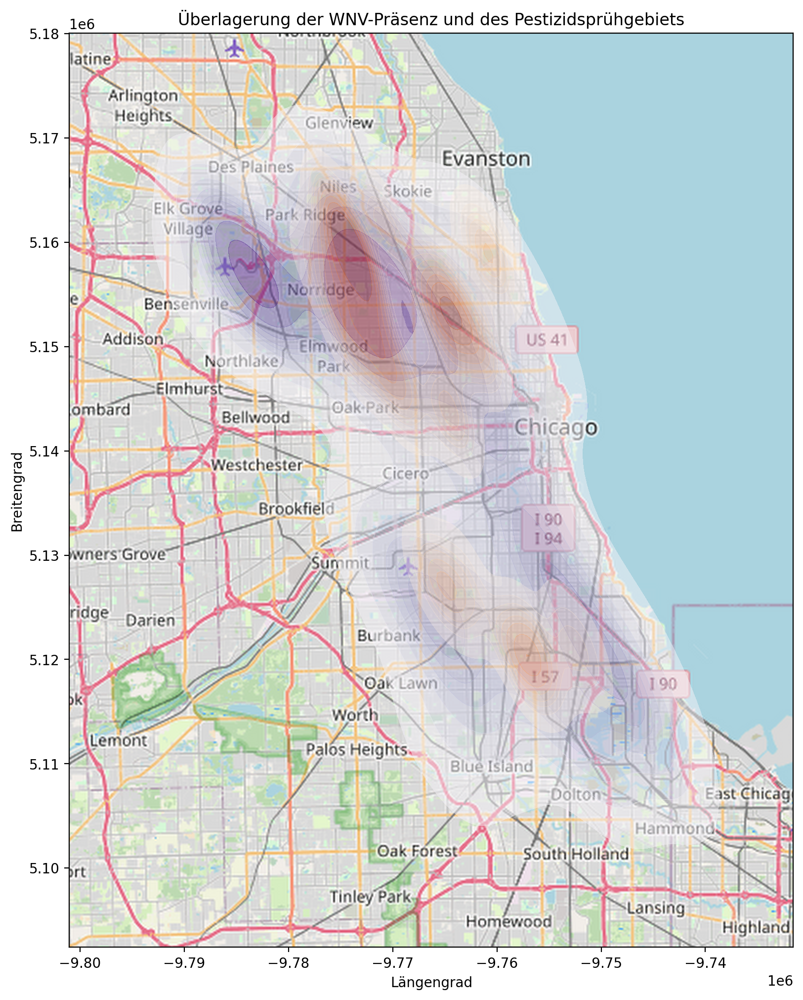

In [39]:
# Überlagerung von Dichteplots der WNV-Präsenz und des Sprühgebiets

t = tilemapbase.tiles.build_OSM()
fig, ax = plt.subplots(figsize=(12,12))
plotter = tilemapbase.Plotter(extent, t, width=250)
plotter.plot(ax)

# Dichteplot der WNV-Präsenz (zuerst zeichnen, lila Farbe)
density_plot = sns.kdeplot(
    x=wnv_present['geometry'].x,
    y=wnv_present['geometry'].y,
    shade=True,
    alpha=0.5,
    cmap="Purples",  # Verwende lila Farbverlauf
    shade_lowest=False,
    zorder=3
)

# Dichteplot des Sprühgebiets (darüber zeichnen, orange Farbe)
density_plot = sns.kdeplot(
    x=spraygeo_df['geometry'].x,
    y=spraygeo_df['geometry'].y,
    shade=True,
    alpha=0.3,
    cmap="Oranges",  # Verwende orange Farbverlauf
    shade_lowest=False,
    zorder=4  # Zeichne über dem ersten Plot
)

plt.title("Überlagerung der WNV-Präsenz und des Pestizidsprühgebiets")
plt.xlabel("Längengrad")
plt.ylabel("Breitengrad")

plt.show()

#### 3. 4. 3 Wetterdaten und WVN-Vorkommen

##### Einfluss der Temperatur auf das Auftreten des WNV

Top 5 tavg-Werte mit höchstem durchschnittlichem WnvPresent:
    tavg  wnvpresent
19  72.0    0.163636
25  78.0    0.138408
27  80.0    0.104651
30  84.0    0.082569
13  65.0    0.076364


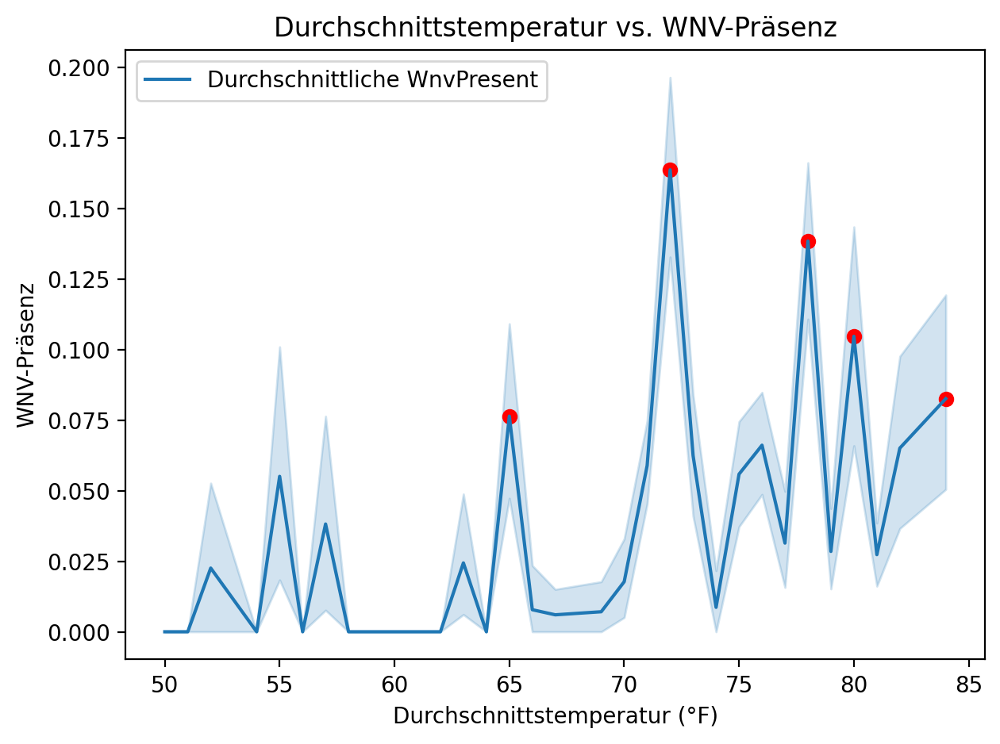

In [58]:

sns.lineplot(
    x='tavg', 
    y='wnvpresent', 
    data=combined_df,
    label='Durchschnittliche WnvPresent'
)

grouped_df = combined_df.groupby('tavg')['wnvpresent'].mean().reset_index()

# Die höchsten 5 tavg-Werte mit dem höchsten durchschnittlichen WnvPresent
top_5 = grouped_df.nlargest(5, 'wnvpresent')
print("Top 5 tavg-Werte mit höchstem durchschnittlichem WnvPresent:")
print(top_5)
plt.scatter(
    top_5['tavg'], 
    top_5['wnvpresent'], 
    color='red'
)

plt.title('Durchschnittstemperatur vs. WNV-Präsenz')
plt.xlabel('Durchschnittstemperatur (°F)')
plt.ylabel('WNV-Präsenz')

plt.tight_layout()
plt.show()


##### Einfluss der Windgeschwindigkeit auf das Auftreten des WNV

Top 5 avgspeed-Werte mit höchstem durchschnittlichem WnvPresent:
    avgspeed  wnvpresent
14       5.7    0.277778
7        4.7    0.255474
23       6.9    0.193548
39       9.3    0.187845
17       6.0    0.160494


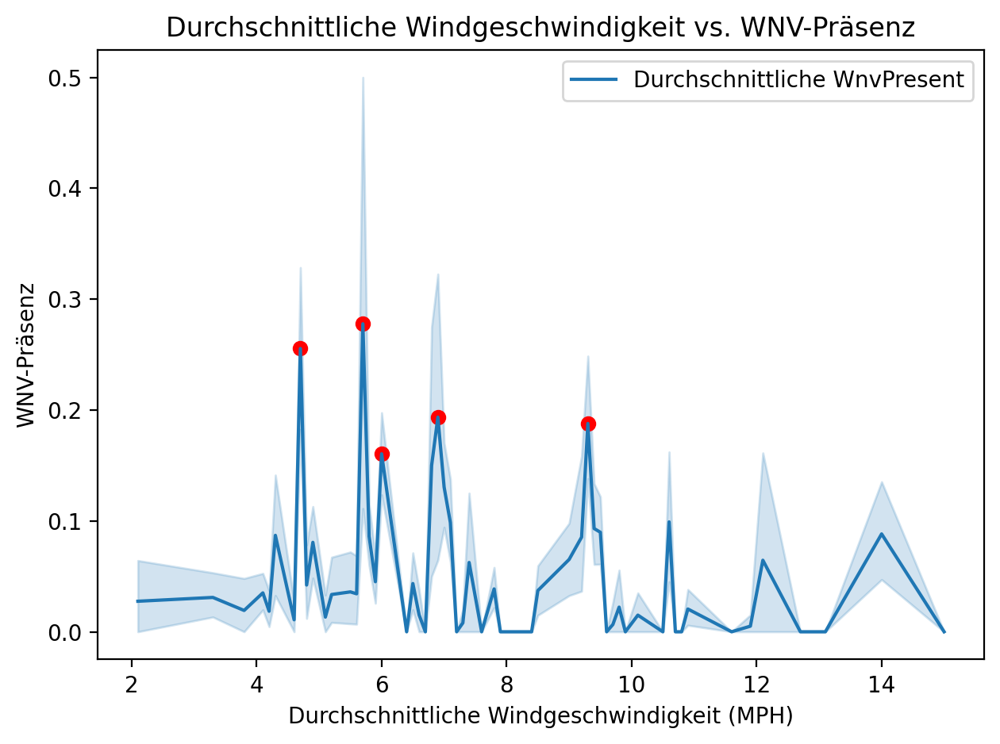

In [56]:
sns.lineplot(
    x='avgspeed', 
    y='wnvpresent', 
    data=combined_df,
    label='Durchschnittliche WnvPresent'
)

grouped_df = combined_df.groupby('avgspeed')['wnvpresent'].mean().reset_index()

# Die höchsten 5 avgspeed-Werte mit dem höchsten durchschnittlichen WnvPresent
top_5 = grouped_df.nlargest(5, 'wnvpresent')
print("Top 5 avgspeed-Werte mit höchstem durchschnittlichem WnvPresent:")
print(top_5)
plt.scatter(
    top_5['avgspeed'], 
    top_5['wnvpresent'], 
    color='red'
)

plt.title('Durchschnittliche Windgeschwindigkeit vs. WNV-Präsenz')
plt.xlabel('Durchschnittliche Windgeschwindigkeit (MPH)')
plt.ylabel('WNV-Präsenz')

plt.tight_layout()
plt.show()


##### Einfluss der relative Luftfeuchtigkeit auf das Auftreten des WNV

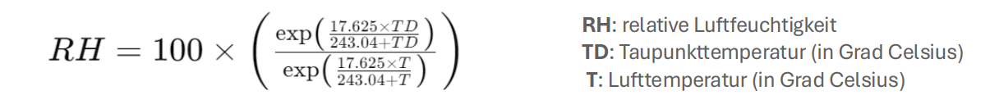

Top 5 Luftfeuchtigkeitswerte mit höchstem durchschnittlichem WnvPresent:
    RelativeHumidity  wnvpresent
76         78.543897    0.333333
32         62.123648    0.255474
30         61.370306    0.219858
17         57.097650    0.187845
78         81.477745    0.179641


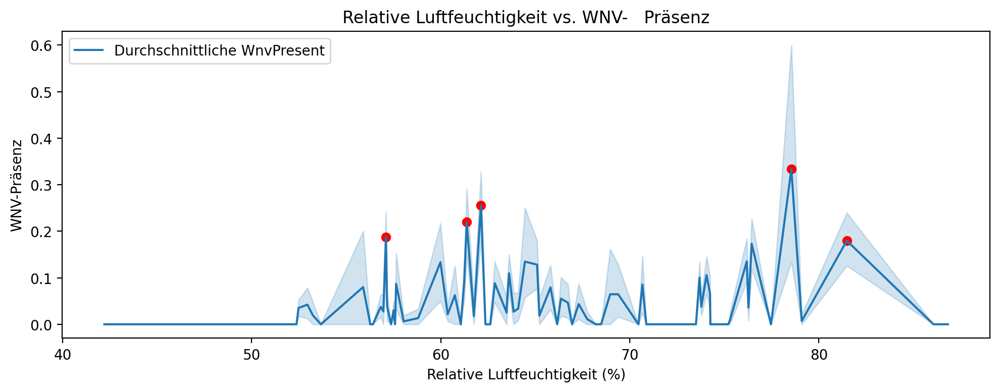

In [57]:
combined_df['RelativeHumidity'] = 100 * (
    np.exp((17.67 * ((combined_df['dewpoint'] - 32) * (5/9))) / 
           (243.5 + ((combined_df['dewpoint'] - 32) * (5/9)))) /
    np.exp((17.67 * ((combined_df['tavg'] - 32) * (5/9))) / 
           (243.5 + ((combined_df['tavg'] - 32) * (5/9))))
)

# Größe des Diagramms festlegen
plt.figure(figsize=(10, 4))

sns.lineplot(
    x='RelativeHumidity', 
    y='wnvpresent', 
    data=combined_df,
    label='Durchschnittliche WnvPresent'  
)

# Top 5 Relative Humidity-Werte mit dem höchsten WnvPresent
grouped_df = combined_df.groupby('RelativeHumidity')['wnvpresent'].mean().reset_index()

# Die höchsten 5 Luftfeuchtigkeitswerte mit dem höchsten durchschnittlichen WnvPresent
top_5_humidity_avg = grouped_df.nlargest(5, 'wnvpresent')
print("Top 5 Luftfeuchtigkeitswerte mit höchstem durchschnittlichem WnvPresent:")
print(top_5_humidity_avg)
plt.scatter(
    top_5_humidity_avg['RelativeHumidity'], 
    top_5_humidity_avg['wnvpresent'], 
    color='red'
)

plt.title('Relative Luftfeuchtigkeit vs. WNV-   Präsenz')
plt.xlabel('Relative Luftfeuchtigkeit (%)')
plt.ylabel('WNV-Präsenz')

plt.tight_layout()
plt.show()

#### 3. 4. 4 Korrelationsmatrix vor der Datenextraktion

C:\Users\Huawei\AppData\Local\Temp\ipykernel_32380\2986715958.py:33: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  merged_data['SprayCount'].fillna(0, inplace=True)


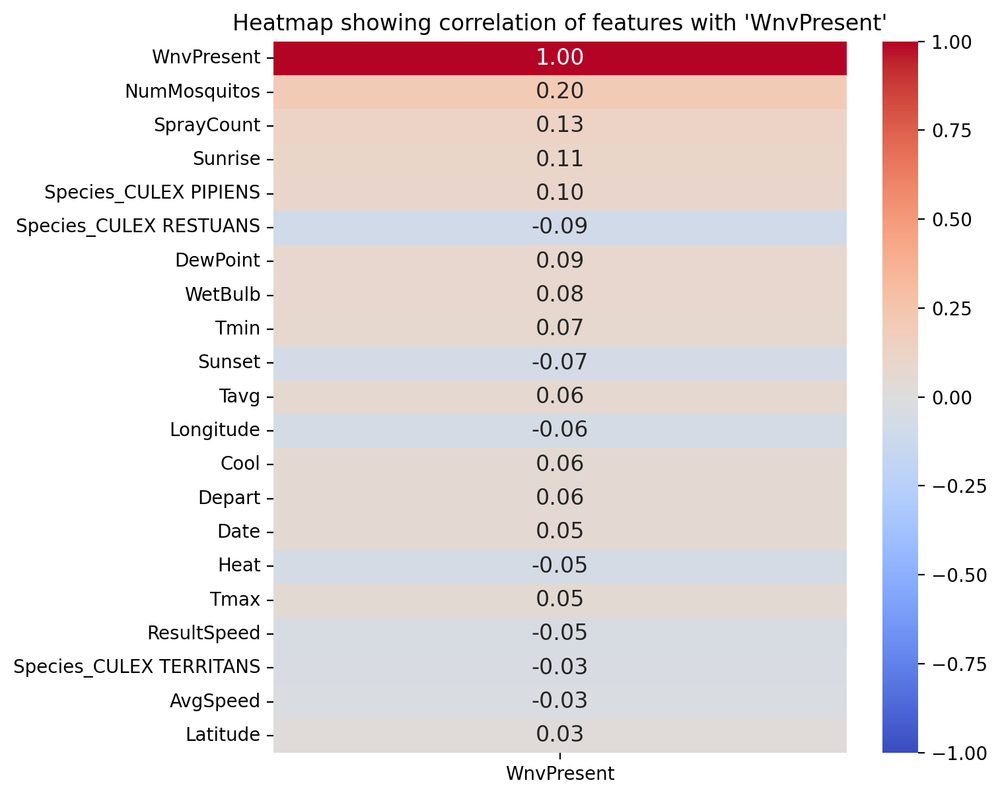

In [52]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# We preprocess data in  order to display a heatmap
def preprocess_data(train, weather, spray, numeric_columns, columns_to_drop):
    # Convert Date columns to datetime
    train['Date'] = pd.to_datetime(train['Date'])
    weather['Date'] = pd.to_datetime(weather['Date'])
    spray['Date'] = pd.to_datetime(spray['Date'])

    # Drop specified columns
    train.drop(columns=columns_to_drop, inplace=True)
    weather.drop(columns=['CodeSum'], inplace=True)  # Assuming 'CodeSum' is not required

    # Convert specified columns in 'weather' to numeric
    for column in numeric_columns:
        weather[column] = pd.to_numeric(weather[column], errors='coerce')

    # One-hot encode categorical variables in 'weather', excluding 'Date'
    weather_encoded = pd.get_dummies(weather, columns=weather.select_dtypes(exclude='number').columns.difference(['Date']))

    # Aggregate numeric weather data by date
    weather_agg = weather_encoded.groupby('Date').mean().reset_index()

    # Aggregate spray data by date and count sprays
    spray_agg = spray.groupby('Date').size().reset_index(name='SprayCount')

    # Merge all dataframes
    merged_data = pd.merge(train, weather_agg, on='Date', how='left')
    merged_data = pd.merge(merged_data, spray_agg, on='Date', how='left')

    # Fill NaN values for 'SprayCount' after merge
    merged_data['SprayCount'].fillna(0, inplace=True)

    return merged_data

def plot_heatmap(data):
    # Perform one-hot encoding for all categorical variables in the train dataset
    data_encoded = pd.get_dummies(data)

    # Calculate the correlation matrix
    correlation_matrix = data_encoded.corr()

    # Extract the correlation with 'WnvPresent' and sort it
    target_correlation = correlation_matrix['WnvPresent'].abs().sort_values(ascending=False).head(21)

    # Prepare the dataframe for plotting: focusing only on correlations with 'WnvPresent'
    for_heatmap = correlation_matrix.loc[target_correlation.index, ['WnvPresent']]

    # Plotting the heatmap
    plt.figure(figsize=(7, 7))
    sns.heatmap(for_heatmap, annot=True, cmap="coolwarm", fmt=".2f", annot_kws={"size": 12}, vmin=-1, vmax=1)
    plt.title("Heatmap showing correlation of features with 'WnvPresent'")
    plt.show()
# Assuming train, weather, and spray DataFrames are defined elsewhere
numeric_columns = ["Tmax", "Tmin", "Tavg", "Depart", "DewPoint", "WetBulb", 
                   "Heat", "Cool", "Depth", "Water1", "SnowFall", "PrecipTotal", 
                   "StnPressure", "SeaLevel", "ResultSpeed", "ResultDir", "AvgSpeed", "Sunset", "Sunrise"]
columns_to_drop = ['Address', 'Block', 'Street', 'AddressNumberAndStreet', 'AddressAccuracy', 'Trap']

# Preprocess and merge data
merged_data = preprocess_data(train, weather, spray, numeric_columns, columns_to_drop)

# Generate heatmap
plot_heatmap(merged_data)